In [163]:
import yolov5
import pandas as pd

# load model
model = yolov5.load('fcakyon/yolov5s-v7.0')

In [185]:
# set model parameters
model.conf = 0.40  # NMS confidence threshold
model.iou = 0.45  # NMS IoU threshold
model.agnostic = True  # NMS class-agnostic
model.multi_label = False  # NMS multiple labels per box
model.max_det = 1000  # maximum number of detections per image
model.classes = [0,40] # Vector config to detect only persons and wine glass in the image

In [180]:
def inference(img):
    # perform inference
    results = model(img)
    # inference with larger input size
    results = model(img, size=640)

    # inference with test time augmentation
    results = model(img, augment=True)

    # parse results
    predictions = results.pred[0]
    boxes = predictions[:, :4] # x1, y1, x2, y2
    scores = predictions[:, 4]
    categories = predictions[:, 5]

    # show detection bounding boxes on image
    results.show()
    
    # print counts of the objects
    results.print()
    
    analyseConfidence(categories,scores)
    
def analyseConfidence(categories,scores):
    # plots the average confidence for each classes 
    df = pd.DataFrame(list(zip(categories.numpy(),scores.numpy()*100)),columns=['class','confidence'])
    df['class'] = df['class'].astype(int).replace(model.names)
    ax = df.groupby('class')['confidence'].mean().plot(xlabel='Average Confidence',ylabel='Classes', kind='barh')
    ax.bar_label(ax.containers[0], label_type='edge')
    plt.show()

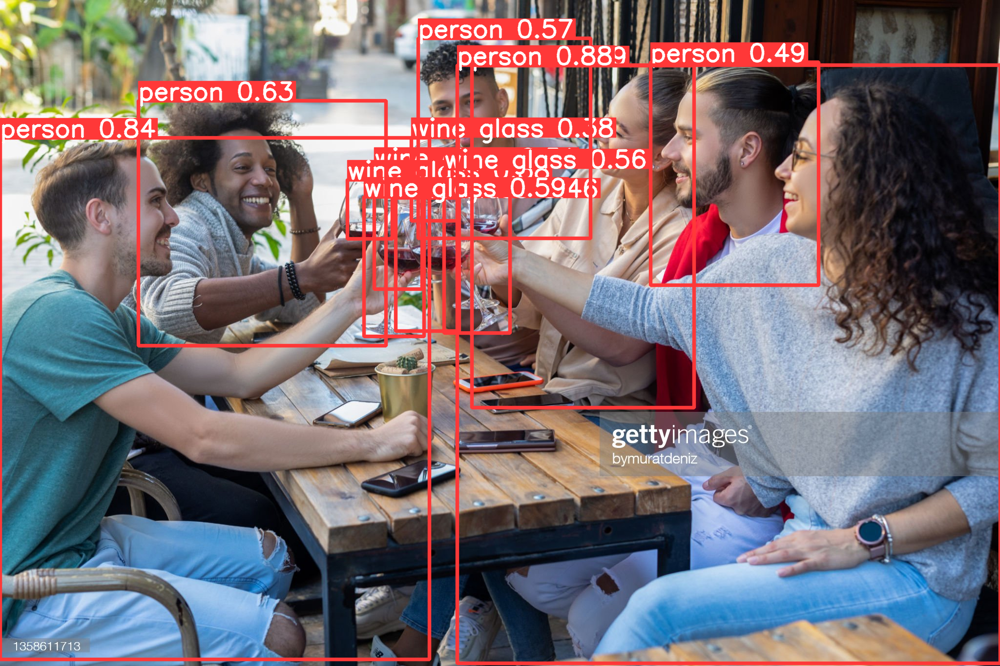

image 1/1: 1365x2048 6 persons, 6 wine glasss
Speed: 25.0ms pre-process, 499.8ms inference, 3.3ms NMS per image at shape (1, 3, 448, 640)


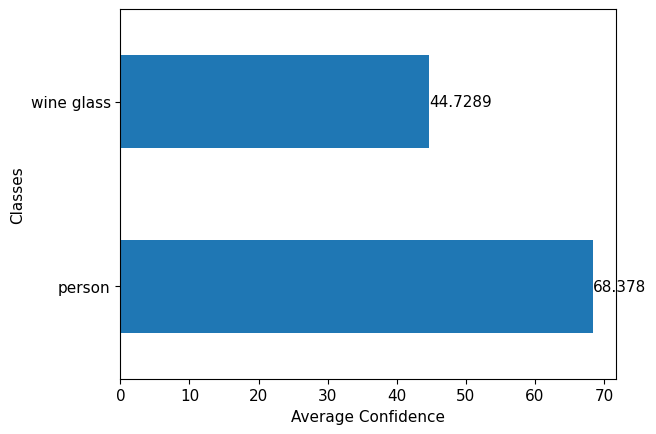

In [181]:
inference('gettyimages-1358611713-2048x2048.jpg')

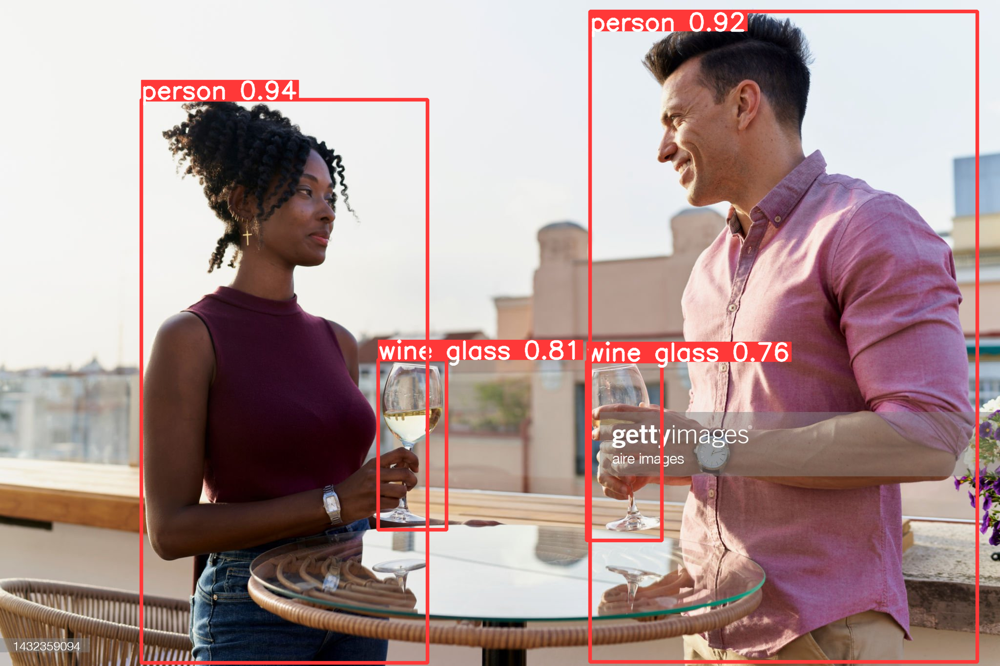

image 1/1: 1366x2048 2 persons, 2 wine glasss
Speed: 21.7ms pre-process, 487.5ms inference, 1.5ms NMS per image at shape (1, 3, 448, 640)


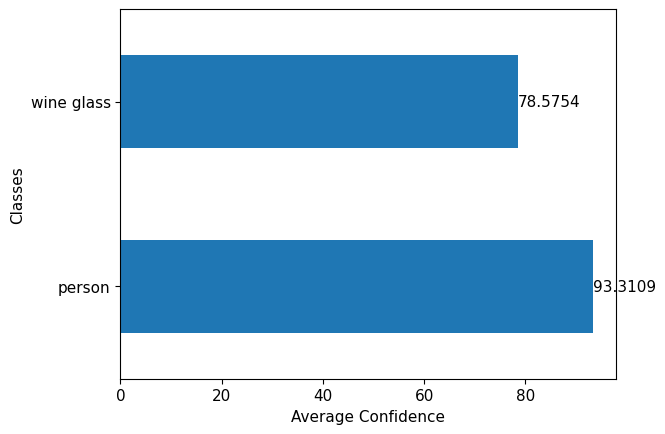

In [182]:
inference('gettyimages-1432359094-2048x2048.jpg')

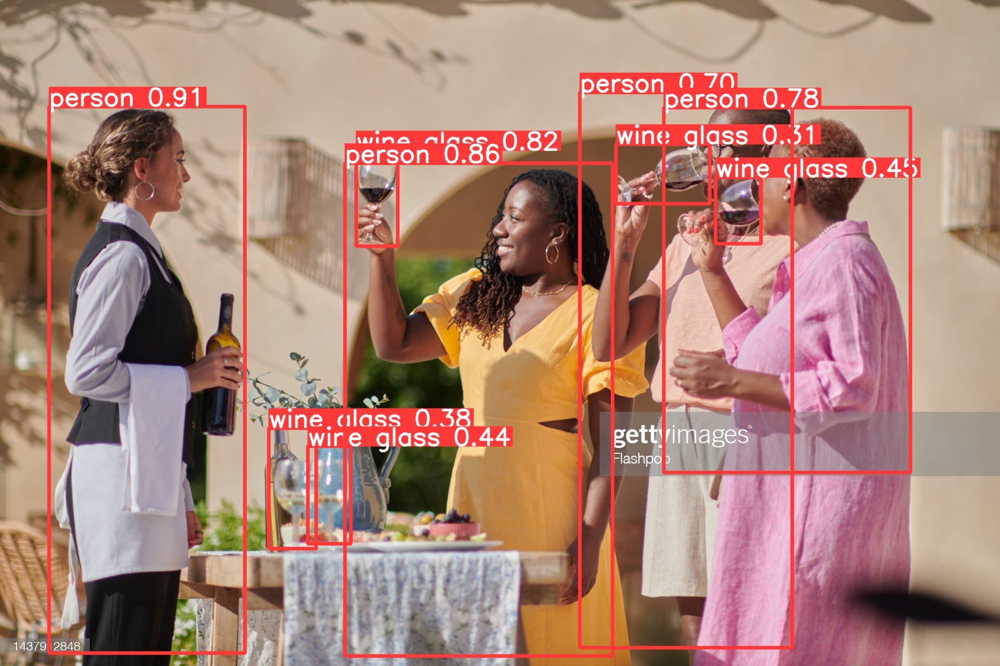

image 1/1: 1365x2048 4 persons, 5 wine glasss
Speed: 22.8ms pre-process, 485.1ms inference, 3.1ms NMS per image at shape (1, 3, 448, 640)


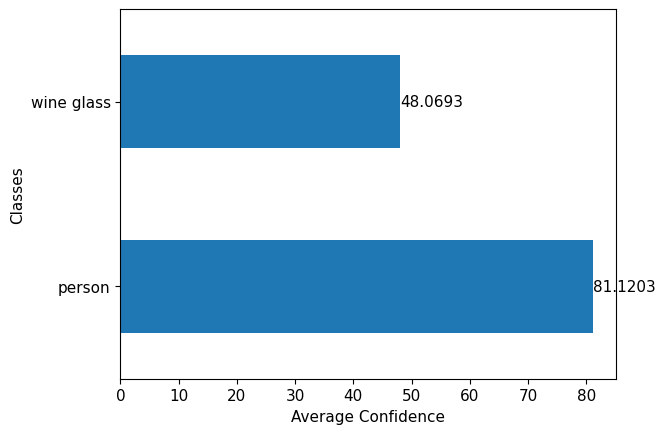

In [183]:
inference('gettyimages-1437912848-2048x2048.jpg')

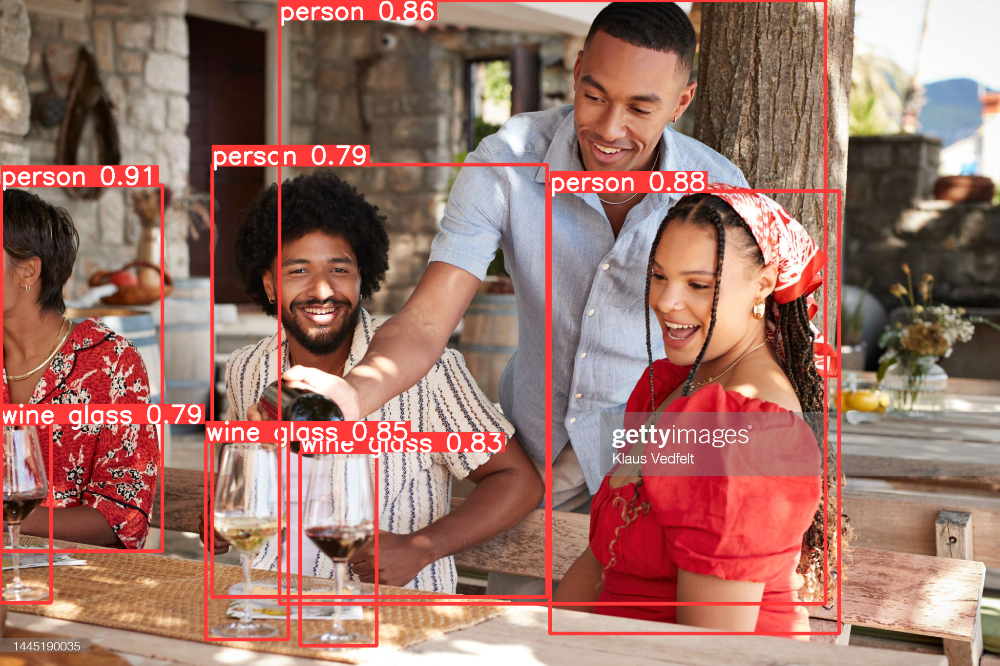

image 1/1: 1365x2048 4 persons, 3 wine glasss
Speed: 23.8ms pre-process, 480.7ms inference, 1.6ms NMS per image at shape (1, 3, 448, 640)


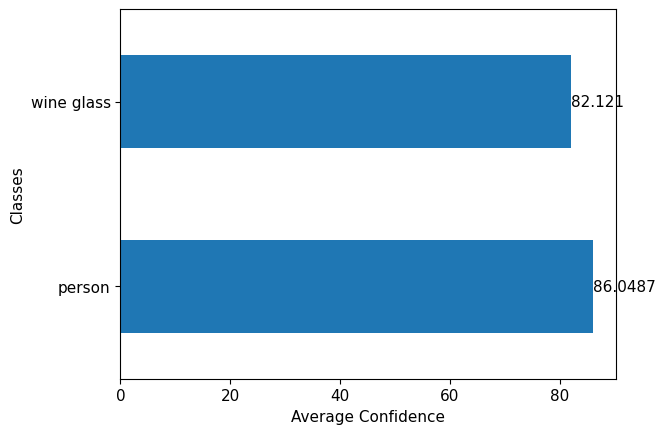

In [186]:
inference('gettyimages-1445190035-2048x2048.jpg')